Import required packages

In [1]:
!pip install transformers[torch] datasets -q

In [2]:
import requests
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForQuestionAnswering,BlipImageProcessor, AutoProcessor
from transformers import BlipConfig
from datasets import load_dataset
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
from datasets import load_dataset
import kagglehub

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
!pip install transformers nltk numpy datasets==2.16.0
!pip install kaggle

Loading DAQUAR Dataset

In [5]:
path = kagglehub.dataset_download("tezansahu/processed-daquar-dataset")

print("Path to dataset files:", path)

100%|██████████| 411M/411M [00:21<00:00, 19.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3


In [6]:
dataset = load_dataset(
    "csv",
    data_files={
        "train": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_train.csv",
        "test": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_eval.csv"
    }
)

with open("/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/answer_space.txt") as f:
    answer_space = f.read().splitlines()

dataset = dataset.map(
    lambda examples: {
        'label': [
            answer_space.index(ans.replace(" ", "").split(",")[0])  # select the 1st answer if multiple answers are provided
            for ans in examples['answer']
        ]
    },
    batched=True
)

Generating train split: 0 examples [00:00, ? examples/s]

/usr/local/lib/python3.10/dist-packages/datasets/download/streaming_download_manager.py:778: FutureWarning: The 'verbose' keyword in pd.read_csv is deprecated and will be removed in a future version.
  return pd.read_csv(xopen(filepath_or_buffer, "rb", download_config=download_config), **kwargs)


Generating test split: 0 examples [00:00, ? examples/s]

/usr/local/lib/python3.10/dist-packages/datasets/download/streaming_download_manager.py:778: FutureWarning: The 'verbose' keyword in pd.read_csv is deprecated and will be removed in a future version.
  return pd.read_csv(xopen(filepath_or_buffer, "rb", download_config=download_config), **kwargs)


Map:   0%|          | 0/6795 [00:00<?, ? examples/s]

Map:   0%|          | 0/5673 [00:00<?, ? examples/s]

In [7]:
dataset

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'image_id', 'label'],
        num_rows: 6795
    })
    test: Dataset({
        features: ['question', 'answer', 'image_id', 'label'],
        num_rows: 5673
    })
})

In [8]:
# Load dataset splits from CSV files
dataset = load_dataset(
    "csv",
    data_files={
        "train": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_train.csv",
        "test": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_eval.csv",
        # "validation": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_val.csv"
    }
)

# Read the answer space from file and split into a list
with open("/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/answer_space.txt", "r") as f:
    answer_space = f.read().splitlines()

# Map each example in the dataset to a label index corresponding to the first answer listed
def label_example(examples):
    return {
        'label': [
            answer_space.index(ans.replace(" ", "").split(",")[0])
            for ans in examples['answer']
        ]
    }

# Apply the mapping function to all splits in the dataset
dataset = dataset.map(label_example, batched=True)

print(dataset)


Map:   0%|          | 0/6795 [00:00<?, ? examples/s]

Map:   0%|          | 0/5673 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'image_id', 'label'],
        num_rows: 6795
    })
    test: Dataset({
        features: ['question', 'answer', 'image_id', 'label'],
        num_rows: 5673
    })
})


In [9]:
dataset = load_dataset(
    "csv",
    data_files={
        "train": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_train.csv",
        "test": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_eval.csv",
        # "validation": "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/data_val.csv"
    }
)

if "label" in dataset["train"].column_names:
    dataset = dataset.remove_columns("label")

dataset = dataset.select_columns(["image_id", "question", "answer"])

print(dataset)


DatasetDict({
    train: Dataset({
        features: ['image_id', 'question', 'answer'],
        num_rows: 6795
    })
    test: Dataset({
        features: ['image_id', 'question', 'answer'],
        num_rows: 5673
    })
})


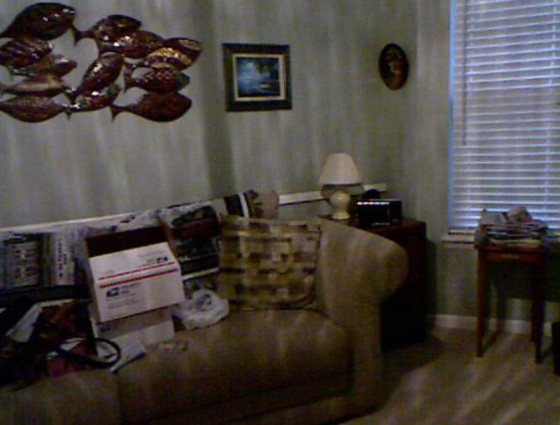

'sofa'

In [10]:
import IPython.display as display

def show_example(train=True, idx=None):
    dataset_type = "train" if train else "test"
    data = dataset[dataset_type]

    if idx is None:
        idx = np.random.randint(len(data))

    image_path =  "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/"+ f"{data[idx]['image_id']}.png"
    image = Image.open(image_path)
    display.display(image)

    question = data[idx]["question"]
    answer = data[idx]["answer"]


    print(f"Question:\t {question}")
    # print(f"Answer:\t\t {answer}")

    return answer
show_example()

Question:	 what is the largest object on the floor


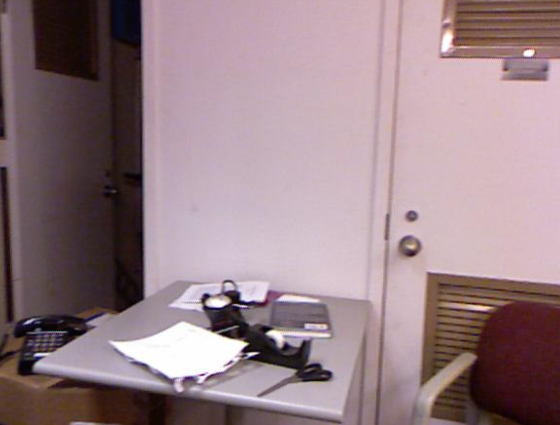

Example 1/10
Question:	 what is on the right side of the black telephone and on the left side of the red chair
Answer:		 desk
--------------------------------------------------


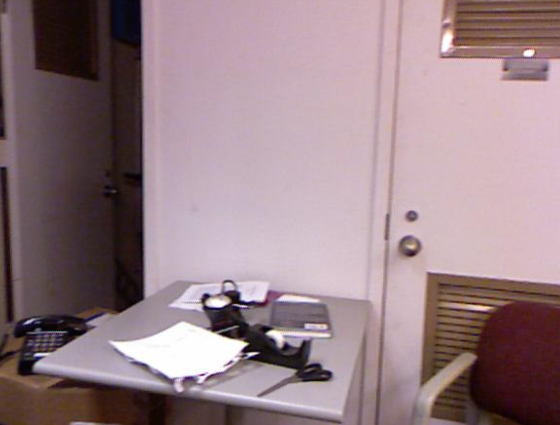

Example 2/10
Question:	 what is in front of the white door on the left side of the desk
Answer:		 telephone
--------------------------------------------------


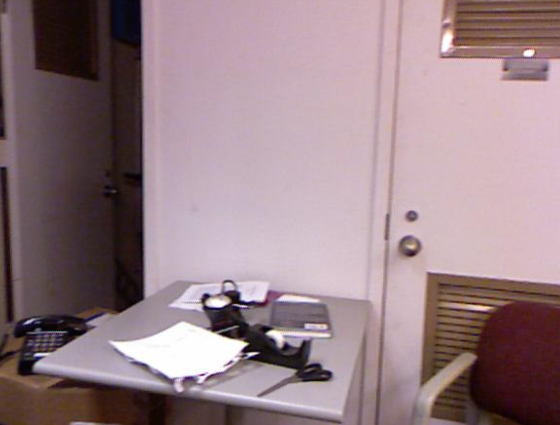

Example 3/10
Question:	 what is on the desk
Answer:		 book, scissor, papers, tape_dispenser
--------------------------------------------------


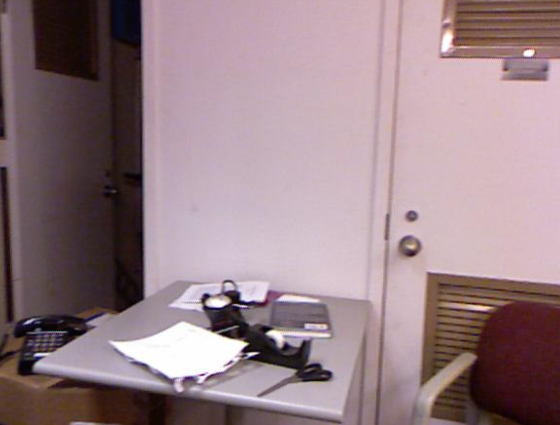

Example 4/10
Question:	 what is the largest brown objects
Answer:		 carton
--------------------------------------------------


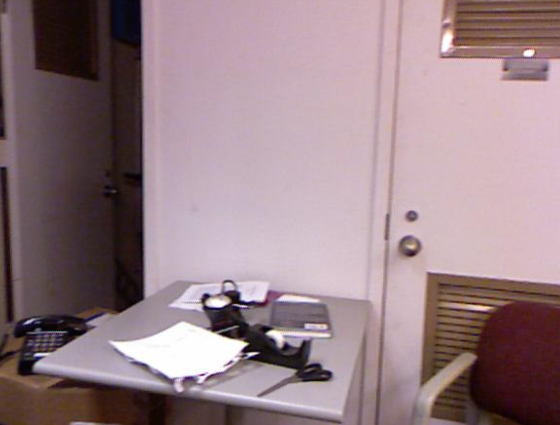

Example 5/10
Question:	 what color is the chair in front of the white wall
Answer:		 red
--------------------------------------------------


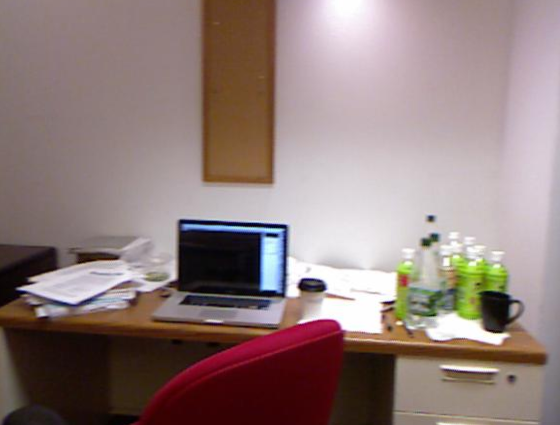

Example 6/10
Question:	 what is on the right side of the notebook on the desk
Answer:		 plastic_cup_of_coffee
--------------------------------------------------


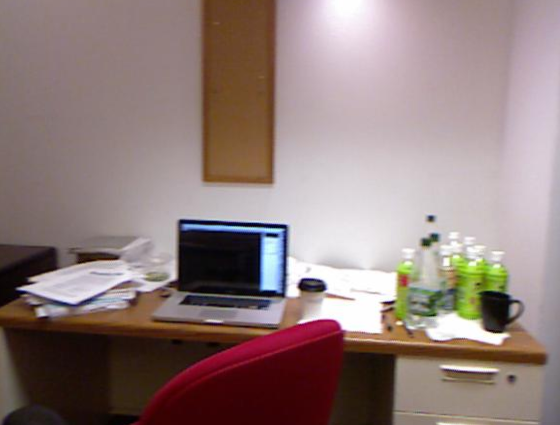

Example 7/10
Question:	 what is on the right and left and in front of the papers on the desk
Answer:		 notebook
--------------------------------------------------


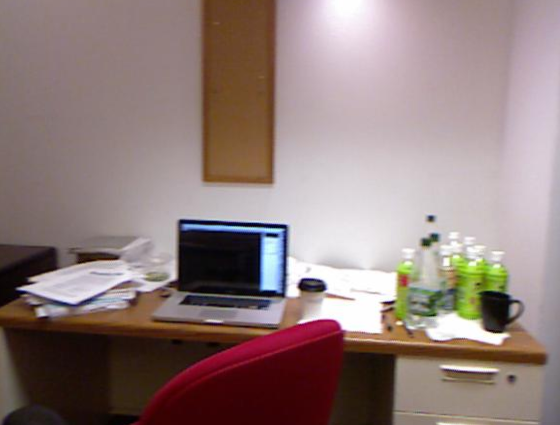

Example 8/10
Question:	 what is on the desk and behind the black cup
Answer:		 bottle
--------------------------------------------------


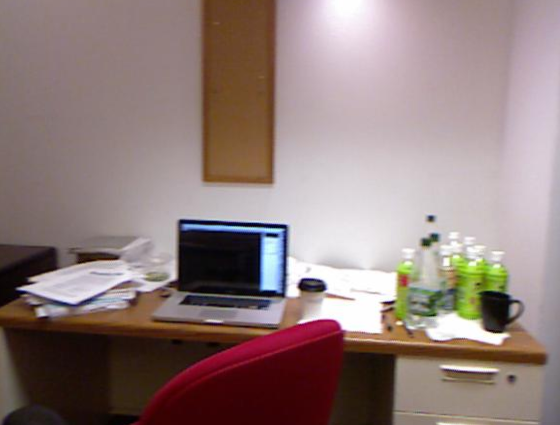

Example 9/10
Question:	 how many bottles are on the desk
Answer:		 11
--------------------------------------------------


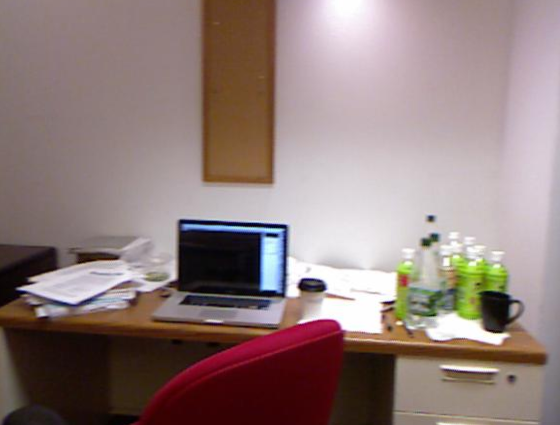

Example 10/10
Question:	 what is in front of the papers and notebook and bottles
Answer:		 chair
--------------------------------------------------


In [11]:
import IPython.display as display
from PIL import Image
import numpy as np

# Extract the train split into a variable
dataset_train = dataset["train"]

# Set how many examples to display
limit = 10
max_examples = min(limit, len(dataset_train))

for i in range(max_examples):
    image_id = dataset_train[i]["image_id"]
    image_path = f"/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/{image_id}.png"

    image = Image.open(image_path)
    display.display(image)

    question = dataset_train[i]["question"]
    answer = dataset_train[i]["answer"]

    print(f"Example {i+1}/{max_examples}")
    print(f"Question:\t {question}")
    print(f"Answer:\t\t {answer}")
    print("-" * 50)


Question: what is in front of the white door on the left side of the desk
Answer: telephone


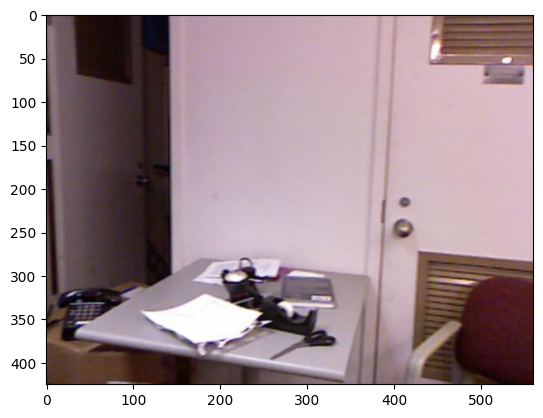

In [12]:
sample = dataset['train'][1]
image_path = f"/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/{sample['image_id']}.png"  # Construct the image path
PIL_image = Image.open(image_path).convert('RGB')  # Open the image using the path
plt.imshow(PIL_image)  # Display the opened image using plt.imshow
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

dataset test

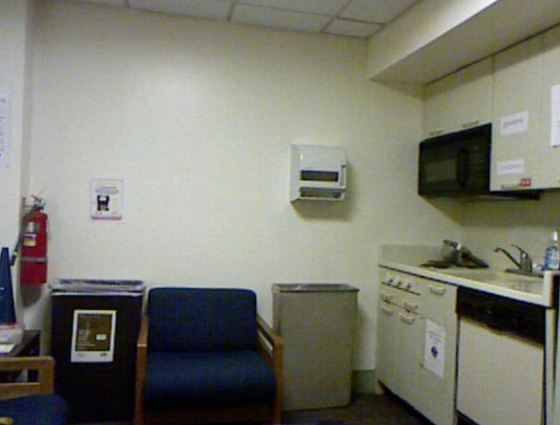

Example 1/10
Question:	 what is on the left side of the white oven on the floor and on right side of the blue armchair
Answer:		 garbage_bin
--------------------------------------------------


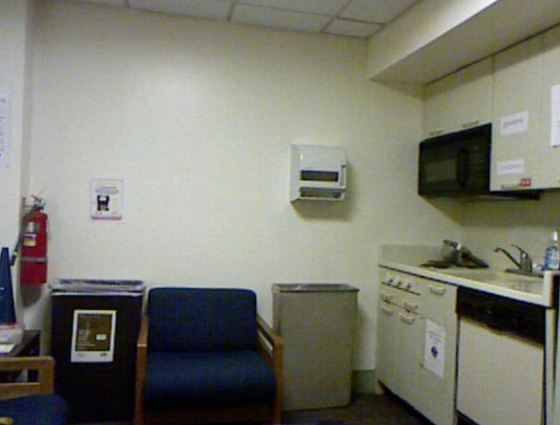

Example 2/10
Question:	 what is on the left side of the fire extinguisher and on the right side of the chair
Answer:		 table
--------------------------------------------------


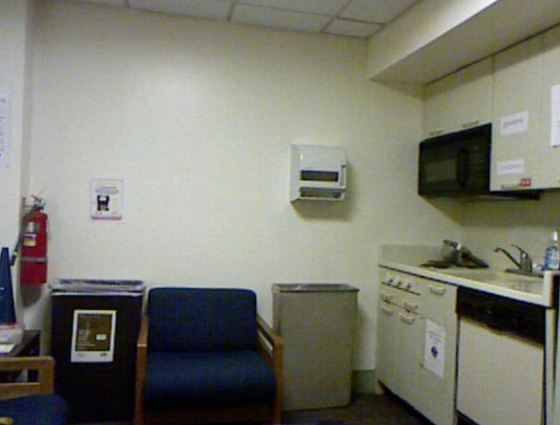

Example 3/10
Question:	 what is between the the two white and black garbage bins
Answer:		 chair
--------------------------------------------------


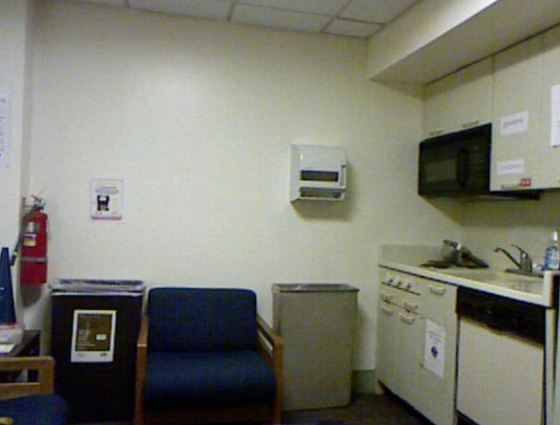

Example 4/10
Question:	 how many objects are between the fire extinguisher and the white oven on the floor
Answer:		 3
--------------------------------------------------


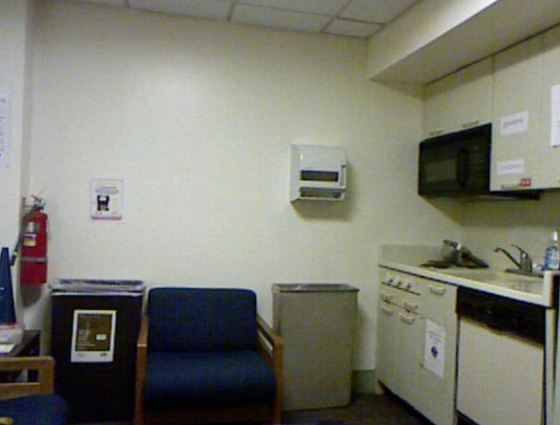

Example 5/10
Question:	 what is the largest object in this picture
Answer:		 washing_machine
--------------------------------------------------


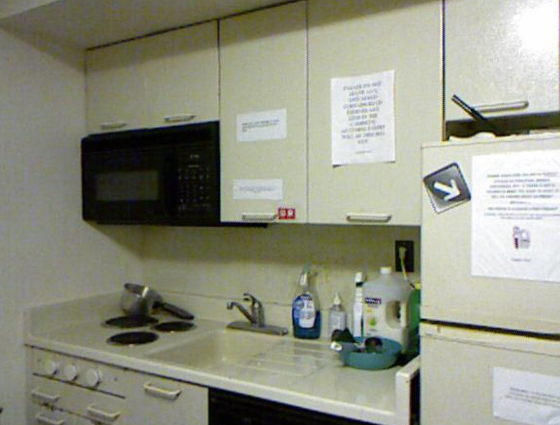

Example 6/10
Question:	 how many plastic bottles are between the white fridge and the oven
Answer:		 5
--------------------------------------------------


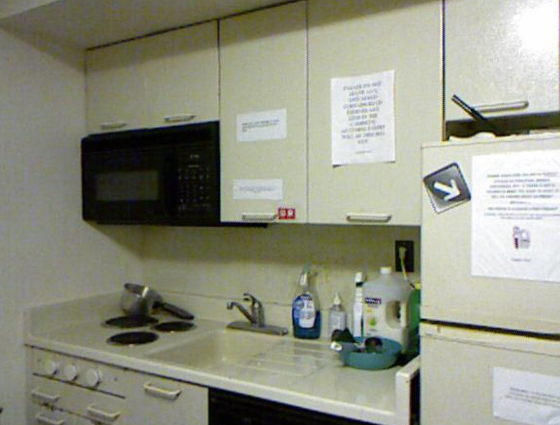

Example 7/10
Question:	 what is under the white cabinet on the right side of the oven and and on the left side of the fridge
Answer:		 sink
--------------------------------------------------


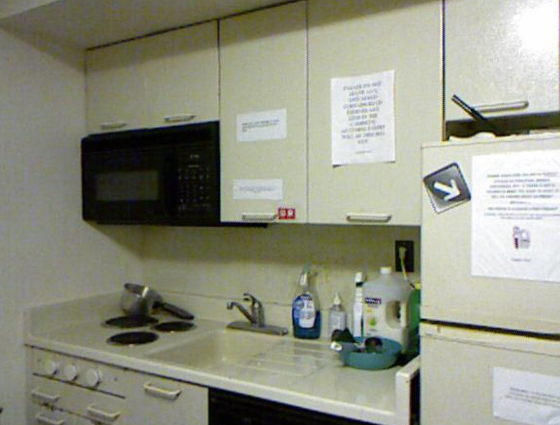

Example 8/10
Question:	 what is on the left side of the white sink and under the cabinet
Answer:		 microwave
--------------------------------------------------


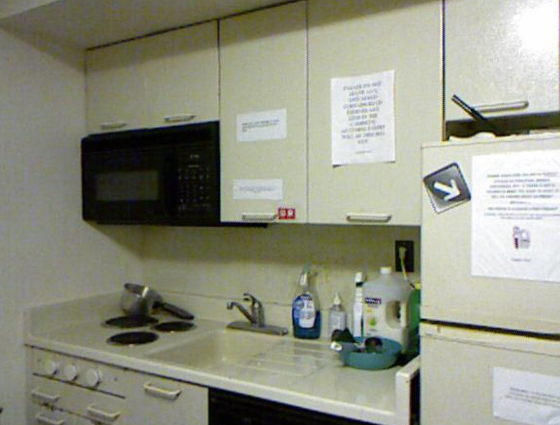

Example 9/10
Question:	 how many white objects in this picture
Answer:		 9
--------------------------------------------------


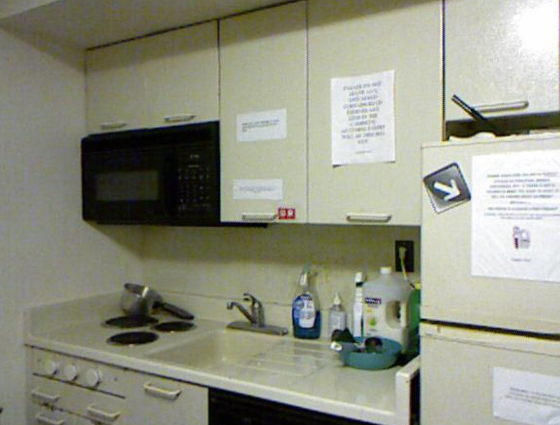

Example 10/10
Question:	 what is under the pan
Answer:		 oven
--------------------------------------------------


In [13]:
import IPython.display as display
from PIL import Image
import numpy as np

# Extract the train split into a variable
dataset_test = dataset["test"]

# Set how many examples to display
limit = 10
max_examples = min(limit, len(dataset_test))

for i in range(max_examples):
    image_id = dataset_test[i]["image_id"]
    image_path = f"/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/{image_id}.png"

    image = Image.open(image_path)
    display.display(image)

    question = dataset_test[i]["question"]
    answer = dataset_test[i]["answer"]

    print(f"Example {i+1}/{max_examples}")
    print(f"Question:\t {question}")
    print(f"Answer:\t\t {answer}")
    print("-" * 50)

Question: what is on the left side of the fire extinguisher and on the right side of the chair
Answer: table


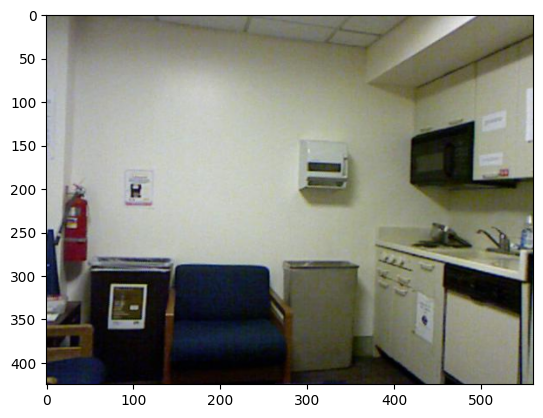

In [14]:
sample = dataset['test'][1]
image_path = f"/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/{sample['image_id']}.png"  # Construct the image path
PIL_image = Image.open(image_path).convert('RGB')  # Open the image using the path
plt.imshow(PIL_image)  # Display the opened image using plt.imshow
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

In [15]:
config = BlipConfig.from_pretrained("Salesforce/blip-vqa-base")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

In [16]:
len(dataset["test"])

5673

In [17]:
train_data = dataset['train']
test_data = dataset['test']

FineTuning BLIP for VQA for DAQUAR dataset

In [18]:
class VQADataset(torch.utils.data.Dataset):
    def __init__(self, data, segment, text_processor, image_processor):
        self.data = data
        self.questions = data['question']
        self.answers = data['answer']
        self.text_processor = text_processor
        self.image_processor = image_processor
        self.max_length = 32
        self.image_height = 128
        self.image_width = 128
        # Get the base image path during initialization
        self.image_base_path = "/root/.cache/kagglehub/datasets/tezansahu/processed-daquar-dataset/versions/3/images/"

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # get image + text
        answers = self.answers[idx]
        questions = self.questions[idx]
        # Construct the image path using the image_id and base path
        image_path = self.image_base_path + f"{self.data[idx]['image_id']}.png"
        image = Image.open(image_path).convert('RGB')
        text = self.questions[idx]

        image_encoding = self.image_processor(image,
                                  do_resize=True,
                                  size=(self.image_height,self.image_width),
                                  return_tensors="pt")

        encoding = self.text_processor(
                                  None,
                                  text,
                                  padding="max_length",
                                  truncation=True,
                                  max_length = self.max_length,
                                  return_tensors="pt"
                                  )
        # # remove batch dimension
        for k,v in encoding.items():
            encoding[k] = v.squeeze()
        encoding["pixel_values"] = image_encoding["pixel_values"][0]
        # # add labels
        labels = self.text_processor.tokenizer.encode(
            answers,
            max_length= self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors='pt'
        )[0]
        encoding["labels"] = labels

        return encoding

In [19]:
text_processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
image_processor = BlipImageProcessor.from_pretrained("Salesforce/blip-vqa-base")

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

In [20]:
train_vqa_dataset = VQADataset(data=train_data,
                     segment='train',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

test_vqa_dataset = VQADataset(data=test_data,
                     segment='validation',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

In [21]:
train_vqa_dataset[0]

{'input_ids': tensor([ 101, 2054, 2003, 2006, 1996, 2157, 2217, 1997, 1996, 2304, 7026, 1998,
        2006, 1996, 2187, 2217, 1997, 1996, 2417, 3242,  102,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[-0.6682, -0.4784, -0.1426,  ..., -0.1280, -0.1280, -0.1280],
         [-0.5660, -0.3470, -0.0988,  ..., -0.0113,  0.0471,  0.0471],
         [-0.5806, -0.3616, -0.0842,  ...,  0.0909,  0.0909,  0.1055],
         ...,
         [-0.6536, -0.6244, -0.5806,  ..., -1.0769, -1.0915, -1.0915],
         [-0.6974, -0.6536, -0.6244,  ..., -1.1353, -1.1499, -1.1207],
         [-0.9310, -0.7266, -0.6390,  ..., -1.2229, -1.2229, -1.1791]],

        [[-0.8516, -0.7316, -0.4164,  ..., -0.5515, -0.5815, -0.6265],
         [-0.7916, -0.6265, -0.3714,  ..., -0.4614, -0.4314, -0.4914],
         [-0.8066, -0.5815, -0.3264,

In [22]:
def collate_fn(batch):
    input_ids = [item['input_ids'] for item in batch]
    pixel_values = [item['pixel_values'] for item in batch]
    attention_mask = [item['attention_mask'] for item in batch]
    labels = [item['labels'] for item in batch]
    # create new batch
    batch = {}
    batch['input_ids'] = torch.stack(input_ids)
    batch['attention_mask'] = torch.stack(attention_mask)
    batch['pixel_values'] = torch.stack(pixel_values)
    batch['labels'] = torch.stack(labels)

    return batch

train_dataloader = DataLoader(train_vqa_dataset,
                              collate_fn=collate_fn,
                              batch_size=64,
                              shuffle=False)
val_dataloader = DataLoader(test_vqa_dataset,
                            collate_fn=collate_fn,
                            batch_size=64,
                            shuffle=False)

In [23]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
    print(k, v.shape)

input_ids torch.Size([64, 32])
attention_mask torch.Size([64, 32])
pixel_values torch.Size([64, 3, 128, 128])
labels torch.Size([64, 32])


In [24]:
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base" )
model.to(device)

model.safetensors:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

BlipForQuestionAnswering(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-05, e

In [25]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
image_mean = image_processor.image_mean
image_std = image_processor.image_std

Question:  [CLS] what is in front of the white door on the left side of the desk [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Answer:  [CLS] telephone [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


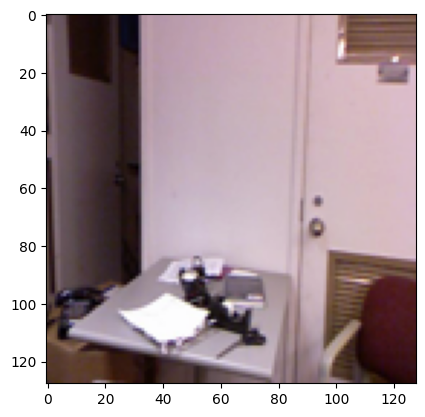

In [26]:
batch_idx = 1

unnormalized_image = (batch["pixel_values"][batch_idx].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)

print("Question: ",text_processor.decode(batch["input_ids"][batch_idx]))
print("Answer: ",text_processor.decode(batch["labels"][batch_idx]))
plt.imshow(Image.fromarray(unnormalized_image))

In [27]:
from sklearn.metrics import accuracy_score, f1_score

In [28]:
!pip install nltk -q
import nltk
nltk.download('wordnet', quiet=True)
from nltk.corpus import wordnet as wn

In [29]:
def compute_wups(preds, labels, threshold=0.9):
    total = len(preds)
    score = 0
    for pred, label in zip(preds, labels):
        # Get wordnet synsets
        pred_synset = wn.synsets(pred)
        label_synset = wn.synsets(label)

        if pred_synset and label_synset:
            # Compute similarity
            sim = wn.wup_similarity(pred_synset[0], label_synset[0]) or 0
            score += 1 if sim >= threshold else sim
        else:
            # Default to 0 for no synsets
            score += 0
    return score / total


In [30]:
losses = []  # For tracking training loss
val_losses = []  # For tracking validation loss


def evaluate(model, dataloader, device):
    model.eval()
    preds = []
    labels = []
    val_loss = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Validating"):
            batch = {k: v.to(device) for k, v in batch.items()}

            outputs = model(**batch)
            val_loss += outputs.loss.item()

            # Instead of taking argmax from last_hidden_state, use model.generate()
            generated_ids = model.generate(
                pixel_values=batch["pixel_values"],
                input_ids=batch["input_ids"],
                attention_mask=batch["attention_mask"],
                max_length=20
            )

            batch_preds = [text_processor.decode(gid, skip_special_tokens=True) for gid in generated_ids]
            batch_labels = [text_processor.decode(lid, skip_special_tokens=True) for lid in batch["labels"]]

            preds.extend(batch_preds)
            labels.extend(batch_labels)

    # Calculate metrics (these will likely still be low if the task is hard,
    # but should no longer be always zero)
    accuracy = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average='weighted', zero_division=0)
    wups = compute_wups(preds, labels)
    return val_loss / len(dataloader), accuracy, f1, wups

Output

Epoch: 1


Training:   0%|          | 0/107 [00:00<?, ?it/s]

We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 3.6446 |Val Loss: 0.3354| Accuracy: 0.1668 | F1: 0.1201 | WUPS: 0.4634
Epoch: 2


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.2155 |Val Loss: 0.2144| Accuracy: 0.1934 | F1: 0.1466 | WUPS: 0.4602
Epoch: 3


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.1419 |Val Loss: 0.1938| Accuracy: 0.1985 | F1: 0.1571 | WUPS: 0.4491
Epoch: 4


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.1095 |Val Loss: 0.1971| Accuracy: 0.2029 | F1: 0.1579 | WUPS: 0.4501
Epoch: 5


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0865 |Val Loss: 0.2065| Accuracy: 0.2018 | F1: 0.1578 | WUPS: 0.4616
Epoch: 6


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0693 |Val Loss: 0.2346| Accuracy: 0.1634 | F1: 0.1391 | WUPS: 0.4006
Epoch: 7


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0572 |Val Loss: 0.2408| Accuracy: 0.1597 | F1: 0.1364 | WUPS: 0.4138
Epoch: 8


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0465 |Val Loss: 0.2331| Accuracy: 0.1844 | F1: 0.1451 | WUPS: 0.4382
Epoch: 9


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0391 |Val Loss: 0.2198| Accuracy: 0.1914 | F1: 0.1651 | WUPS: 0.4418
Epoch: 10


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0336 |Val Loss: 0.2494| Accuracy: 0.1690 | F1: 0.1425 | WUPS: 0.4422
Epoch: 11


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0285 |Val Loss: 0.2951| Accuracy: 0.1696 | F1: 0.1338 | WUPS: 0.4561
Epoch: 12


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0255 |Val Loss: 0.2544| Accuracy: 0.1685 | F1: 0.1372 | WUPS: 0.4557
Epoch: 13


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0224 |Val Loss: 0.2453| Accuracy: 0.1860 | F1: 0.1627 | WUPS: 0.4591
Epoch: 14


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0172 |Val Loss: 0.2592| Accuracy: 0.1749 | F1: 0.1633 | WUPS: 0.4175
Epoch: 15


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0169 |Val Loss: 0.2631| Accuracy: 0.1876 | F1: 0.1742 | WUPS: 0.4409
Epoch: 16


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0150 |Val Loss: 0.2610| Accuracy: 0.2017 | F1: 0.1767 | WUPS: 0.4139
Epoch: 17


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0110 |Val Loss: 0.2532| Accuracy: 0.2166 | F1: 0.1862 | WUPS: 0.4392
Epoch: 18


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0096 |Val Loss: 0.2656| Accuracy: 0.2159 | F1: 0.1937 | WUPS: 0.4393
Epoch: 19


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0089 |Val Loss: 0.2707| Accuracy: 0.2043 | F1: 0.1854 | WUPS: 0.4298
Epoch: 20


Training:   0%|          | 0/107 [00:00<?, ?it/s]

Validating:   0%|          | 0/89 [00:00<?, ?it/s]

Train Loss: 0.0077 |Val Loss: 0.2633| Accuracy: 0.2089 | F1: 0.1960 | WUPS: 0.4254


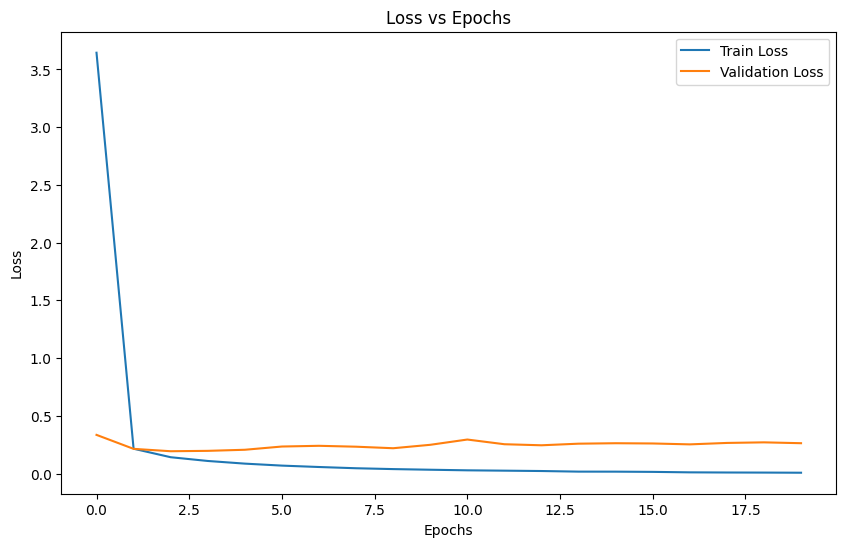

In [31]:
model.train()
for epoch in range(20):
    print(f"Epoch: {epoch+1}")
    total_loss = []

    # Training phase
    for batch in tqdm(train_dataloader, desc="Training"):
        batch = {k: v.to(device) for k, v in batch.items()}

        optimizer.zero_grad()
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

        total_loss.append(loss.item())

    avg_train_loss = sum(total_loss) / len(train_dataloader)
    losses.append(avg_train_loss)

    # Validation phase
    val_loss, accuracy, f1, wups = evaluate(model, val_dataloader, device)
    val_losses.append(val_loss)

    print(f"Train Loss: {avg_train_loss:.4f} |Val Loss: {val_loss:.4f}| Accuracy: {accuracy:.4f} | F1: {f1:.4f} | WUPS: {wups:.4f}")

# Plot Loss
plt.figure(figsize=(10, 6))
plt.plot(losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs Epochs")
plt.legend()
plt.show()


Sample Prediction

Question:  what are the objects on the counter
Predicted Answer:  newspapers
Actual Answer:  plate, cup, bottle, spoon, bag


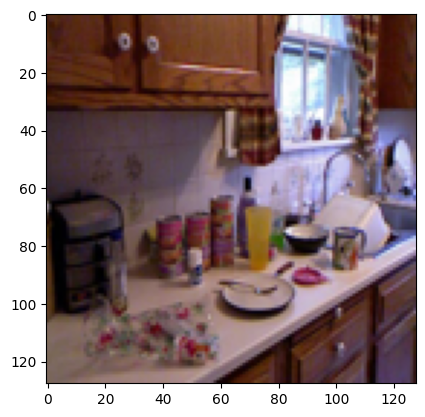

In [48]:
idx = 750
sample = test_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))